Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Import data set

In [2]:
orig_data = pd.read_csv('Data/features_3_sec.csv')
full_orig_data = pd.read_csv('Data/features_30_sec.csv')

Explore the data

In [4]:
print(orig_data.shape)
print(full_orig_data.shape)

(9990, 60)
(1000, 60)


In [61]:
orig_data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [67]:
cols = list(orig_data.columns[3:60])
cols

['chroma_stft_var',
 'rms_mean',
 'rms_var',
 'spectral_centroid_mean',
 'spectral_centroid_var',
 'spectral_bandwidth_mean',
 'spectral_bandwidth_var',
 'rolloff_mean',
 'rolloff_var',
 'zero_crossing_rate_mean',
 'zero_crossing_rate_var',
 'harmony_mean',
 'harmony_var',
 'perceptr_mean',
 'perceptr_var',
 'tempo',
 'mfcc1_mean',
 'mfcc1_var',
 'mfcc2_mean',
 'mfcc2_var',
 'mfcc3_mean',
 'mfcc3_var',
 'mfcc4_mean',
 'mfcc4_var',
 'mfcc5_mean',
 'mfcc5_var',
 'mfcc6_mean',
 'mfcc6_var',
 'mfcc7_mean',
 'mfcc7_var',
 'mfcc8_mean',
 'mfcc8_var',
 'mfcc9_mean',
 'mfcc9_var',
 'mfcc10_mean',
 'mfcc10_var',
 'mfcc11_mean',
 'mfcc11_var',
 'mfcc12_mean',
 'mfcc12_var',
 'mfcc13_mean',
 'mfcc13_var',
 'mfcc14_mean',
 'mfcc14_var',
 'mfcc15_mean',
 'mfcc15_var',
 'mfcc16_mean',
 'mfcc16_var',
 'mfcc17_mean',
 'mfcc17_var',
 'mfcc18_mean',
 'mfcc18_var',
 'mfcc19_mean',
 'mfcc19_var',
 'mfcc20_mean',
 'mfcc20_var',
 'label']

Check missing data

In [63]:
orig_data.isna().sum(axis=0)

filename                   0
length                     0
chroma_stft_mean           0
chroma_stft_var            0
rms_mean                   0
rms_var                    0
spectral_centroid_mean     0
spectral_centroid_var      0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
rolloff_mean               0
rolloff_var                0
zero_crossing_rate_mean    0
zero_crossing_rate_var     0
harmony_mean               0
harmony_var                0
perceptr_mean              0
perceptr_var               0
tempo                      0
mfcc1_mean                 0
mfcc1_var                  0
mfcc2_mean                 0
mfcc2_var                  0
mfcc3_mean                 0
mfcc3_var                  0
mfcc4_mean                 0
mfcc4_var                  0
mfcc5_mean                 0
mfcc5_var                  0
mfcc6_mean                 0
mfcc6_var                  0
mfcc7_mean                 0
mfcc7_var                  0
mfcc8_mean                 0
mfcc8_var     

Column distributions

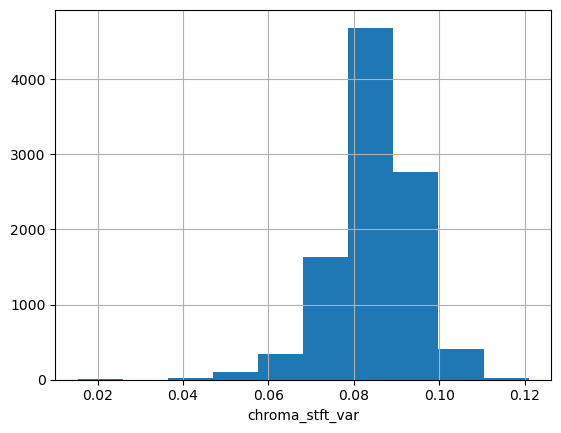

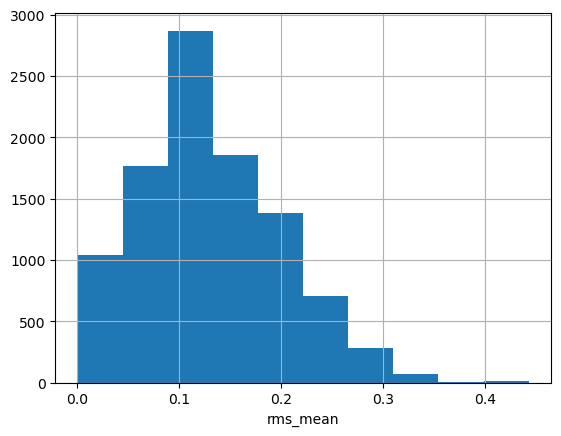

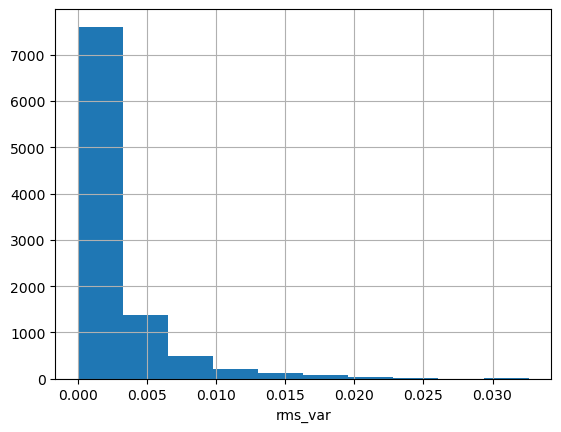

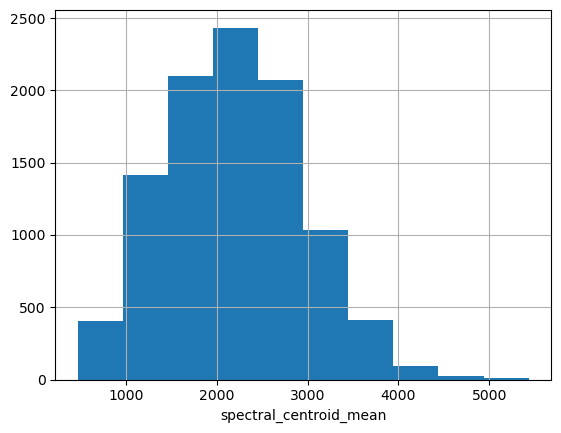

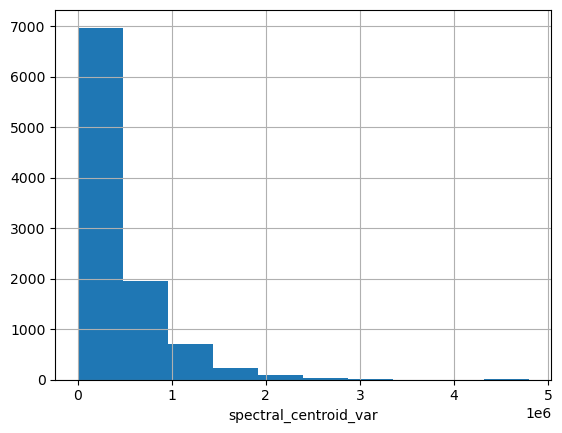

...

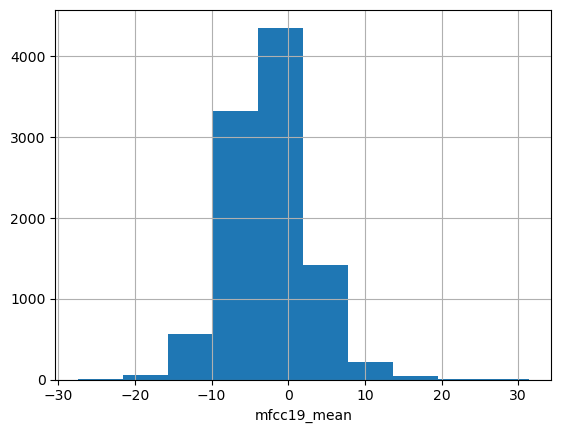

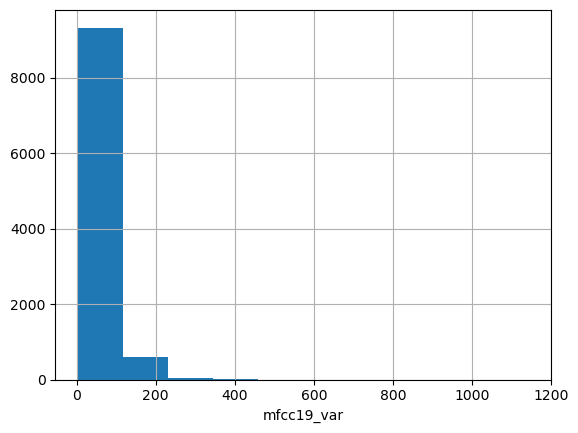

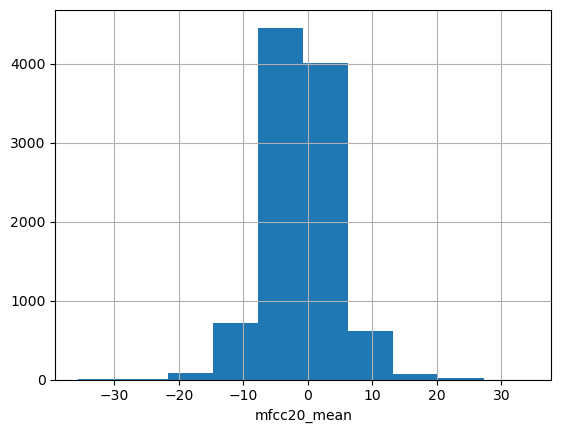

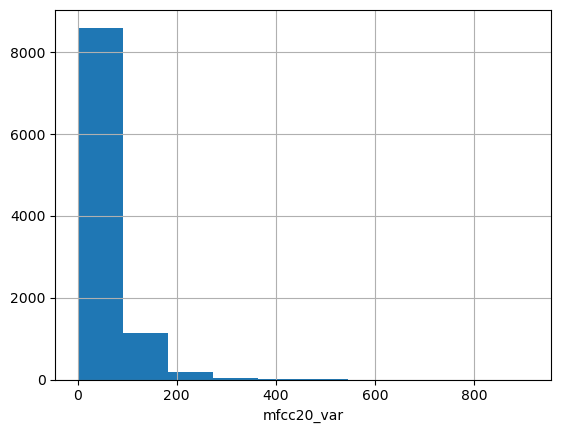

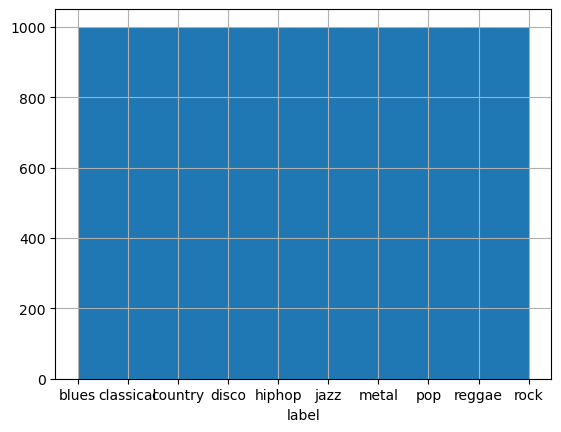

In [70]:
for i in range(3,60):
    orig_data.iloc[:,i].hist()
    plt.xlabel(cols[i-3])
    plt.show()

In [7]:
new_labels_data = orig_data
new_labels_data['second_label'] = np.where( (new_labels_data['label']=='blues') | (new_labels_data['label']=='country') |
                                           (new_labels_data['label']=='disco') | (new_labels_data['label']=='hiphop') | 
                                           (new_labels_data['label']=='metal') | (new_labels_data['label']=='pop') |
                                           (new_labels_data['label']=='reggae') | (new_labels_data['label']=='rock'), 0,
                                           np.where(new_labels_data['label']=='classical',1,2) )

Label encode label

In [8]:
# the problem is that using label encoders creates an implied order
from sklearn.preprocessing import LabelEncoder

# lets change the name of our dataframe
encoded_label_data = new_labels_data
# del imputedDF

#create instance of label encoder
lab = LabelEncoder()

#perform label encoding on 'team' column
encoded_label_data['first_label'] = lab.fit_transform(encoded_label_data['label'])

encoded_label_data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label,second_label,first_label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues,0,0
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues,0,0
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues,0,0
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues,0,0
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues,0,0


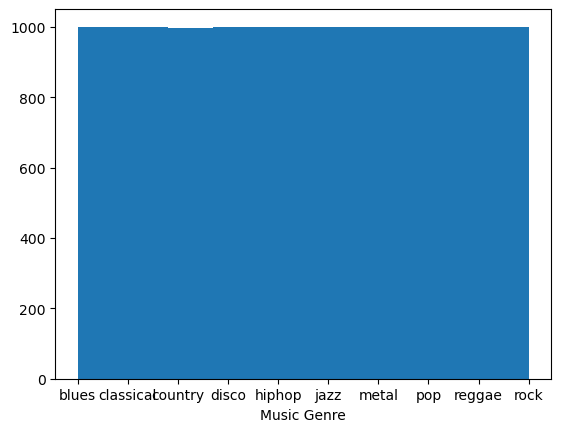

In [94]:
plt.hist(encoded_label_data['label'])
plt.xlabel('Music Genre')
plt.show()

Wrapper feature selection

In [9]:
# split training and testing set
from sklearn.model_selection import train_test_split

xDF = encoded_label_data.iloc[:,3:58]
yDF_all = encoded_label_data['first_label']

# Create testing set
xTrain, xTest, yTrain, yTest = train_test_split(
    xDF, yDF_all, 
    test_size=0.05,
    shuffle = True,
    stratify = yDF_all,
    random_state=117)

# Create training and validation set
xTrainVal, xVal, yTrainVal, yVal = train_test_split(xTrain, yTrain, test_size=0.2, stratify = yTrain, random_state=42)


In [10]:
from sklearn.feature_selection import RFE
from sklearn import tree

In [11]:

model = tree.DecisionTreeRegressor()
selector = RFE(model, n_features_to_select=10, step=1)
selector = selector.fit(xTrainVal, yTrainVal)
selector.support_

array([False, False, False, False, False,  True, False, False, False,
       False, False,  True,  True,  True,  True, False,  True, False,
       False, False,  True, False, False, False, False, False,  True,
       False,  True, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [12]:
columnsToRemove = []
for col in xTrainVal.columns:
    if col not in xTrainVal.columns[selector.get_support()]:
        columnsToRemove.append(col)

xTrainVal = xTrainVal.drop(columnsToRemove, axis=1)
xVal = xVal.drop(columnsToRemove, axis=1)


In [105]:
xTrainVal

,spectral_bandwidth_mean,harmony_mean,harmony_var,perceptr_mean,perceptr_var,mfcc1_mean,mfcc3_mean,mfcc4_mean,mfcc6_mean,mfcc9_mean
4554,2529.882391,0.000151,0.018808,-0.000031,0.003639,-98.655968,-4.296803,47.598213,24.183113,5.456203
249,1587.097441,-0.000042,0.003938,-0.000170,0.001270,-285.357819,-10.640458,87.808907,14.634820,-2.338600
4793,2942.328194,0.000056,0.010272,0.000109,0.005715,-63.351509,2.473999,25.463856,0.009031,-3.036164
4688,3079.322921,0.000013,0.036847,-0.000117,0.011032,-81.930710,34.995792,47.633808,9.919760,-0.654327
4708,3299.538546,-0.000056,0.040779,-0.000658,0.013655,-61.124489,42.168293,31.201015,8.847137,-5.585937
...,...,...,...,...,...,...,...,...,...,...
4266,2864.700191,0.000606,0.007752,0.001257,0.007807,-130.445572,18.776398,26.908915,10.950516,-2.556285
8140,2214.781879,-0.003571,0.005981,-0.002362,0.004594,-167.777557,-13.587338,33.088924,28.912636,-10.086191
2401,2516.626390,-0.000011,0.006243,-0.000137,0.004048,-95.315010,-5.714087,30.833929,-2.924613,-4.678070
9463,2808.881598,0.000030,0.009885,0.000045,0.004234,-63.363522,-5.019480,31.313732,7.654498,-6.275954


In [106]:
yTrainVal.head()

4554    4
249     0
4793    4
4688    4
4708    4
Name: first_label, dtype: int64

Hyperparameter optimization

In [14]:
from sklearn.model_selection import GridSearchCV

In [15]:
from sklearn.linear_model import LogisticRegression

In [120]:

parameters = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'lbfgs', 'sag', 'newton-cg'],
    'max_iter': [100, 500, 1000]
}

gridSearch = GridSearchCV(estimator = LogisticRegression(multi_class='ovr'),  
                           param_grid = parameters,
                           scoring = 'f1_macro',
                           cv = 5,
                           verbose=0)


gridSearch.fit(xTrainVal, yTrainVal) 

logisticParams = gridSearch.best_params_

logisticParams

/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

{'C': 100, 'max_iter': 1000, 'penalty': 'l1', 'solver': 'liblinear'}

{'C': 100, 'max_iter': 1000, 'penalty': 'l1', 'solver': 'liblinear'}

In [13]:
from sklearn.svm import SVC

In [140]:
parameters = {
              'C':[1,10,100,1000],
              'gamma':[1,0.1,0.001,0.0001],
              'kernel':['linear','rbf']}

gridSearch = GridSearchCV(estimator = SVC(),  
                           param_grid = parameters,
                           scoring = 'f1_macro',
                           cv = 5,
                           verbose=0)

gridSearch.fit(xTrainVal, yTrainVal) 

svcParams = gridSearch.best_params_

svcParams

{'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}

{'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}

In [14]:
from sklearn.neural_network import MLPClassifier

In [143]:

parameters = parameter_space = {
    'max_iter': [1000],
    'hidden_layer_sizes': [(50,50), (50,50,50), (100)],
    'activation': ['relu'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}
gridSearch = GridSearchCV(estimator = MLPClassifier(),  
                           param_grid = parameters,
                           scoring = 'f1_macro',
                           cv = 5,
                           verbose=0)


gridSearch.fit(xTrainVal, yTrainVal) 

mlpParams = gridSearch.best_params_

mlpParams

{'activation': 'relu',
 'alpha': 0.0001,
 'hidden_layer_sizes': (50, 50, 50),
 'learning_rate': 'adaptive',
 'max_iter': 1000,
 'solver': 'adam'}

{'activation': 'relu',
 'alpha': 0.0001,
 'hidden_layer_sizes': (50, 50, 50),
 'learning_rate': 'adaptive',
 'max_iter': 1000,
 'solver': 'adam'}

In [15]:
from sklearn.tree import DecisionTreeClassifier

In [145]:

parameters = {'criterion': ['gini', 'entropy'],
              'splitter': ['best', 'random'],
              'max_depth': [None, 10, 20, 30, 40, 50],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4],
              'max_features': [None, 'sqrt', 'log2']}

              
gridSearch = GridSearchCV(estimator = DecisionTreeClassifier(),  
                           param_grid = parameters,
                           scoring = 'f1_macro',
                           cv = 5,
                           verbose=0)


gridSearch.fit(xTrainVal, yTrainVal) 

treeParams = gridSearch.best_params_

treeParams

/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^

{'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

{'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [16]:
from sklearn.ensemble import RandomForestClassifier

In [121]:
parameters = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['log2', 'sqrt'],
    'bootstrap': [True, False]
}

gridSearch = GridSearchCV(estimator = RandomForestClassifier(),  
                           param_grid = parameters,
                           scoring = 'f1_macro',
                           cv = 5,
                           verbose=0)


gridSearch.fit(xTrainVal, yTrainVal) 

randforestParams = gridSearch.best_params_

randforestParams

/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 982, in _score
    scores = scorer(estimator, X_test, y_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_scorer.py", line 253, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/bretttracy/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_scorer.py", line 350, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                  

{'bootstrap': True,
 'max_depth': None,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 50}

In [17]:
from sklearn.neighbors import KNeighborsClassifier

In [124]:
parameters = {'n_neighbors': [3, 5, 7, 10],
              'weights': ['uniform', 'distance'],
              'algorithm': ['auto', 'ball_tree', 
              'kd_tree', 'brute'],
              'p': [1, 2]
              }

gridSearch = GridSearchCV(estimator = KNeighborsClassifier(),  
                           param_grid = parameters,
                           scoring = 'f1_macro',
                           cv = 5,
                           verbose=0)

gridSearch.fit(xTrainVal, yTrainVal) 

knnParams = gridSearch.best_params_

knnParams

{'algorithm': 'auto', 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}

{'bootstrap': True,
 'max_depth': None,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 50}

Cross validation

In [18]:
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score,classification_report

In [19]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
f1Scores = []
precisionScores = []
recallScores = []
accuracyScores = []
genre_labels = [0,1,2,3,4,5,6,7,8,9]

In [20]:
all_labels = list(set(yDF_all))
type(all_labels)

list

In [90]:
encoded_label_data['label']

0       0
1       0
2       0
3       0
4       0
       ..
9985    9
9986    9
9987    9
9988    9
9989    9
Name: label, Length: 9990, dtype: int64

In [21]:
def cross_validate(x,y,estimator,labels):
    for i, (train_index, test_index) in enumerate(cv.split(x, y)):

        ### making training and validation sets
        # Convert indices to list
        train_index = train_index.tolist()
        test_index = test_index.tolist()
        
        # Split the data into training and testing sets for this fold
        xTrain, xTest = x.iloc[train_index], x.iloc[test_index]
        yTrain, yTest = y.iloc[train_index], y.iloc[test_index]

        # ### feature scaling
        xScaler = StandardScaler()
        xColNames = xTrain.columns.values.tolist()

        # # train the scaler and apply it to the training set
        xTrainScaled = xScaler.fit_transform(xTrain[xColNames])

        # # apply the scaling to the testing set
        xTestScaled = xScaler.transform(xTest[xColNames])


        ### model training
        # instantiate the model
        clf = estimator

        # Train the classifier on the training data
        clf.fit(xTrainScaled, yTrain)
        
        ### model prediction and evaluation
        # Make predictions on the test data
        yPred = clf.predict(xTestScaled)

        report = classification_report(yTest, yPred, target_names=labels)
        # print(report)
        
        # # Calculate metrics and store them
        # # Calculate metrics and store them
        # score = accuracy_score(yTest, yPred)
        # accuracyScores.append(score)

        # score = f1_score(yTest, yPred, average = None)
        # f1Scores.append(score)

        # score = precision_score(yTest, yPred, average = None)
        # precisionScores.append(score)

        # score = recall_score(yTest, yPred, average = None)
        # recallScores.append(score)

        print(f"Completed Fold {i}")
        print(f"    Report{report}")

    # ## Calculate the mean scores across all folds
    # mean_score = sum(accuracyScores) / len(accuracyScores)
    # print("Mean accuracy score:", mean_score)

    # mean_score = sum(f1Scores) / len(f1Scores)
    # print("Mean f1 score:", mean_score)

    # mean_score = sum(precisionScores) / len(precisionScores)
    # print("Mean precision score:", mean_score)

    # mean_score = sum(recallScores) / len(recallScores)
    # print("Mean recall score:", mean_score)

Validating

In [22]:
all_genre_labels = set(orig_data['label'])

In [110]:
print('Logistic Regression Classification Report')
cross_validate(xTrainVal,yTrainVal,LogisticRegression(multi_class='ovr',C = 100, max_iter = 1000, penalty = 'l1', solver ='liblinear'),all_genre_labels)

Completed Fold 0
    Report              precision    recall  f1-score   support

        rock       0.48      0.57      0.52       152
         pop       0.80      0.92      0.86       152
      reggae       0.41      0.36      0.38       152
        jazz       0.46      0.43      0.45       152
     country       0.59      0.34      0.43       152
      hiphop       0.55      0.54      0.54       152
       blues       0.64      0.79      0.71       152
       metal       0.58      0.80      0.67       152
       disco       0.56      0.49      0.53       152
   classical       0.35      0.28      0.31       151

    accuracy                           0.55      1519
   macro avg       0.54      0.55      0.54      1519
weighted avg       0.54      0.55      0.54      1519

Completed Fold 1
    Report              precision    recall  f1-score   support

        rock       0.48      0.54      0.51       152
         pop       0.80      0.92      0.85       152
      reggae       0.40 

In [117]:
print('SVC Classification Report')
cross_validate(xTrainVal,yTrainVal,SVC(C = 100, gamma = 0.0001, kernel ='rbf',decision_function_shape='ovr'),all_genre_labels)

Completed Fold 0
    Report              precision    recall  f1-score   support

        rock       0.45      0.57      0.50       152
         pop       0.76      0.88      0.82       152
      reggae       0.43      0.39      0.41       152
        jazz       0.48      0.44      0.46       152
     country       0.64      0.40      0.49       152
      hiphop       0.60      0.59      0.59       152
       blues       0.67      0.80      0.73       152
       metal       0.65      0.80      0.72       152
       disco       0.61      0.45      0.52       152
   classical       0.34      0.33      0.34       151

    accuracy                           0.57      1519
   macro avg       0.56      0.57      0.56      1519
weighted avg       0.56      0.57      0.56      1519

Completed Fold 1
    Report              precision    recall  f1-score   support

        rock       0.51      0.55      0.53       152
         pop       0.76      0.86      0.81       152
      reggae       0.47 

In [115]:
print('MLPC Classification Report')
cross_validate(xTrainVal,yTrainVal,MLPClassifier(activation = 'relu',
                                                    alpha = 0.0001,
                                                    hidden_layer_sizes = (50, 50, 50),
                                                    learning_rate = 'adaptive',
                                                    max_iter = 1000,
                                                    solver = 'adam'
                                                    ),all_genre_labels)

Completed Fold 0
    Report              precision    recall  f1-score   support

        rock       0.80      0.78      0.79       152
         pop       0.92      0.97      0.94       152
      reggae       0.70      0.75      0.72       152
        jazz       0.73      0.77      0.75       152
     country       0.81      0.74      0.78       152
      hiphop       0.79      0.81      0.80       152
       blues       0.90      0.87      0.89       152
       metal       0.82      0.80      0.81       152
       disco       0.79      0.74      0.77       152
   classical       0.72      0.75      0.74       151

    accuracy                           0.80      1519
   macro avg       0.80      0.80      0.80      1519
weighted avg       0.80      0.80      0.80      1519

Completed Fold 1
    Report              precision    recall  f1-score   support

        rock       0.85      0.76      0.81       152
         pop       0.92      0.88      0.90       152
      reggae       0.71 

In [116]:
print('Decision Tree Classification Report')
cross_validate(xTrainVal,yTrainVal,DecisionTreeClassifier(criterion = 'gini',
                                                            max_depth = None,
                                                            max_features = None,
                                                            min_samples_leaf = 1,
                                                            min_samples_split = 2,
                                                            splitter = 'best'),all_genre_labels)

Completed Fold 0
    Report              precision    recall  f1-score   support

        rock       0.60      0.58      0.59       152
         pop       0.87      0.89      0.88       152
      reggae       0.54      0.59      0.57       152
        jazz       0.59      0.58      0.58       152
     country       0.65      0.59      0.62       152
      hiphop       0.71      0.70      0.71       152
       blues       0.73      0.74      0.74       152
       metal       0.70      0.68      0.69       152
       disco       0.59      0.62      0.61       152
   classical       0.55      0.55      0.55       151

    accuracy                           0.65      1519
   macro avg       0.65      0.65      0.65      1519
weighted avg       0.65      0.65      0.65      1519

Completed Fold 1
    Report              precision    recall  f1-score   support

        rock       0.62      0.52      0.57       152
         pop       0.83      0.89      0.86       152
      reggae       0.51 

In [122]:
print('Random Forest Classification Report')
cross_validate(xTrainVal,yTrainVal,RandomForestClassifier(bootstrap = True,
                                                            max_depth = None,
                                                            max_features = 'log2',
                                                            min_samples_leaf = 1,
                                                            min_samples_split = 2,
                                                            n_estimators = 50),all_genre_labels)

Completed Fold 0
    Report              precision    recall  f1-score   support

        rock       0.82      0.79      0.80       152
         pop       0.86      0.98      0.91       152
      reggae       0.78      0.80      0.79       152
        jazz       0.78      0.81      0.79       152
     country       0.88      0.76      0.82       152
      hiphop       0.86      0.87      0.86       152
       blues       0.85      0.89      0.87       152
       metal       0.85      0.82      0.83       152
       disco       0.81      0.83      0.82       152
   classical       0.80      0.73      0.76       151

    accuracy                           0.83      1519
   macro avg       0.83      0.83      0.83      1519
weighted avg       0.83      0.83      0.83      1519

Completed Fold 1
    Report              precision    recall  f1-score   support

        rock       0.82      0.76      0.78       152
         pop       0.85      0.99      0.91       152
      reggae       0.71 

In [125]:
print('k-NN Classification Report')
cross_validate(xTrainVal,yTrainVal,KNeighborsClassifier(algorithm = 'auto', 
                                                        n_neighbors = 5,
                                                        p = 1,
                                                        weights = 'distance'),all_genre_labels)

Completed Fold 0
    Report              precision    recall  f1-score   support

        rock       0.81      0.80      0.80       152
         pop       0.89      0.99      0.93       152
      reggae       0.73      0.78      0.76       152
        jazz       0.82      0.82      0.82       152
     country       0.87      0.79      0.83       152
      hiphop       0.78      0.87      0.82       152
       blues       0.90      0.90      0.90       152
       metal       0.93      0.84      0.88       152
       disco       0.83      0.82      0.83       152
   classical       0.84      0.77      0.80       151

    accuracy                           0.84      1519
   macro avg       0.84      0.84      0.84      1519
weighted avg       0.84      0.84      0.84      1519

Completed Fold 1
    Report              precision    recall  f1-score   support

        rock       0.86      0.80      0.83       152
         pop       0.85      0.97      0.91       152
      reggae       0.72 

Retrain best models

In [25]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [24]:
# ### feature scaling
xScaler = StandardScaler()
xColNames = xTrain.columns.values.tolist()

# # train the scaler and apply it to the training set
xTrainScaled = xScaler.fit_transform(xTrain[xColNames])

# # apply the scaling to the testing set
xTestScaled = xScaler.transform(xTest[xColNames])

nl = '\n'

Neural Network:
              precision    recall  f1-score   support

        rock       0.90      0.88      0.89        50
         pop       0.94      0.96      0.95        50
      reggae       0.78      0.76      0.77        50
        jazz       0.91      0.82      0.86        50
     country       0.90      0.90      0.90        50
      hiphop       0.82      0.90      0.86        50
       blues       0.92      0.92      0.92        50
       metal       0.94      0.90      0.92        50
       disco       0.87      0.90      0.88        50
   classical       0.75      0.76      0.75        50

    accuracy                           0.87       500
   macro avg       0.87      0.87      0.87       500
weighted avg       0.87      0.87      0.87       500



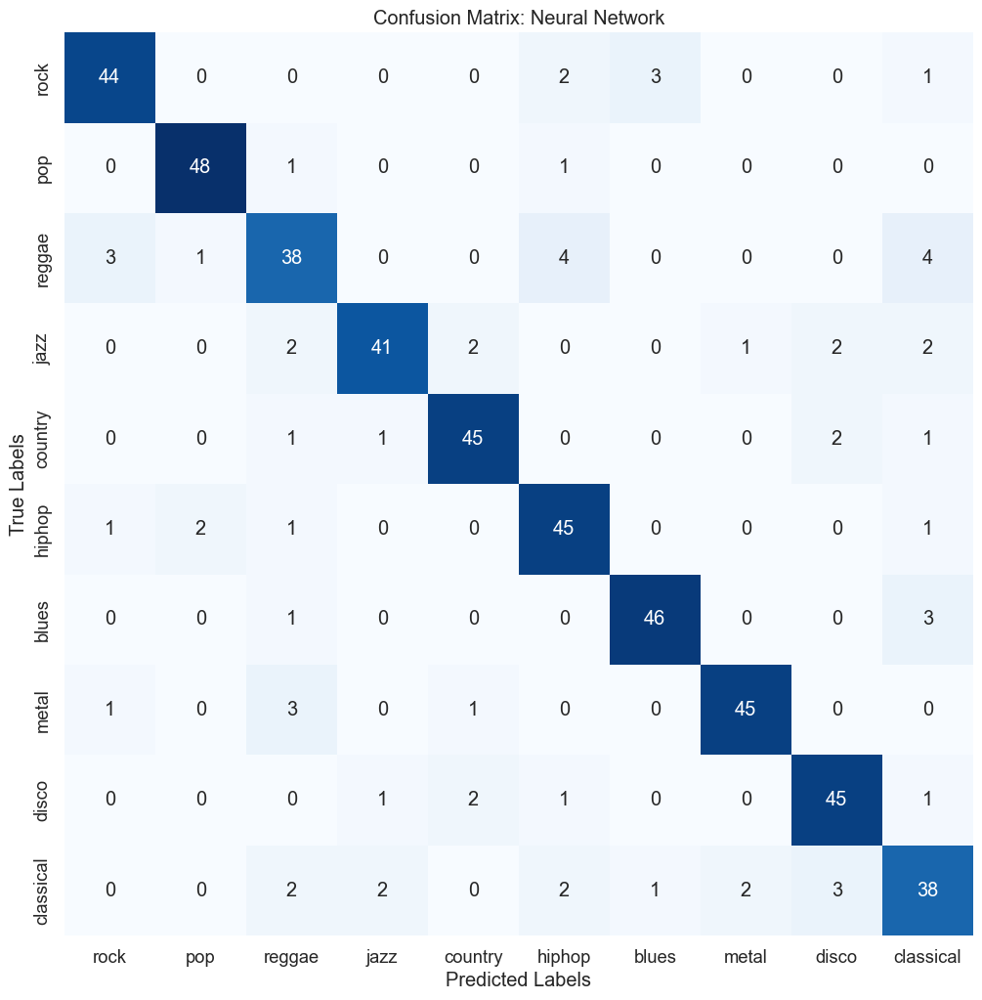

In [143]:
### model training
# instantiate the model
clf = MLPClassifier(activation = 'relu',
                    alpha = 0.0001,
                    hidden_layer_sizes = (50, 50, 50),
                    learning_rate = 'adaptive',
                    max_iter = 1000,
                    solver = 'adam'
                    )

# Train the classifier on the training data
clf.fit(xTrainScaled, yTrain)
        
### model prediction and evaluation
# Make predictions on the test data
yPred = clf.predict(xTestScaled)

report = classification_report(yTest, yPred, target_names=all_genre_labels)
print(f'Neural Network:{nl}{report}')
cm = confusion_matrix(yTest,yPred)

plt.figure(figsize=(12, 12))
sns.set(font_scale=1.2)  # Adjust font size for better readability

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=all_genre_labels,
            yticklabels=all_genre_labels)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix: Neural Network')
plt.show()

Random Forest:
              precision    recall  f1-score   support

        jazz       0.83      0.90      0.87        50
      hiphop       0.92      0.96      0.94        50
       blues       0.87      0.82      0.85        50
      reggae       0.76      0.84      0.80        50
         pop       0.82      0.84      0.83        50
        rock       0.85      0.88      0.86        50
     country       0.84      0.92      0.88        50
   classical       0.88      0.86      0.87        50
       metal       0.86      0.84      0.85        50
       disco       0.83      0.60      0.70        50

    accuracy                           0.85       500
   macro avg       0.85      0.85      0.84       500
weighted avg       0.85      0.85      0.84       500



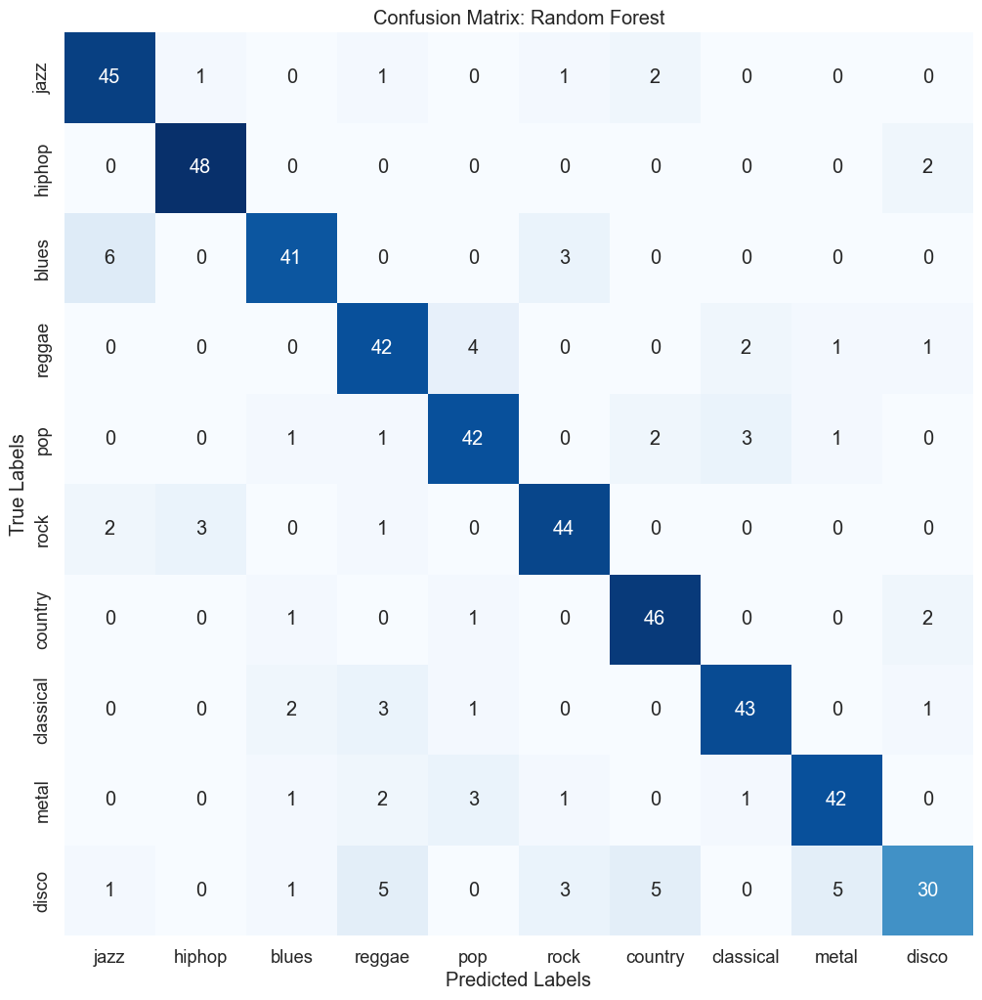

In [29]:
### model training
# instantiate the model
clf = RandomForestClassifier(bootstrap = True,
                            max_depth = None,
                            max_features = 'log2',
                            min_samples_leaf = 1,
                            min_samples_split = 2,
                            n_estimators = 50)

# Train the classifier on the training data
clf.fit(xTrainScaled, yTrain)
        
### model prediction and evaluation
# Make predictions on the test data
yPred = clf.predict(xTestScaled)

report = classification_report(yTest, yPred, target_names=all_genre_labels)
print(f'Random Forest:{nl}{report}')
cm = confusion_matrix(yTest,yPred)

plt.figure(figsize=(12, 12))
sns.set(font_scale=1.2)  # Adjust font size for better readability

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=all_genre_labels,
            yticklabels=all_genre_labels)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix: Random Forest')
plt.show()

k-NN:
              precision    recall  f1-score   support

        rock       0.94      0.96      0.95        50
         pop       0.96      0.94      0.95        50
      reggae       0.92      0.88      0.90        50
        jazz       0.85      0.94      0.90        50
     country       0.94      0.92      0.93        50
      hiphop       0.90      0.90      0.90        50
       blues       0.98      0.98      0.98        50
       metal       0.96      0.94      0.95        50
       disco       0.89      0.94      0.91        50
   classical       0.91      0.84      0.88        50

    accuracy                           0.92       500
   macro avg       0.92      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



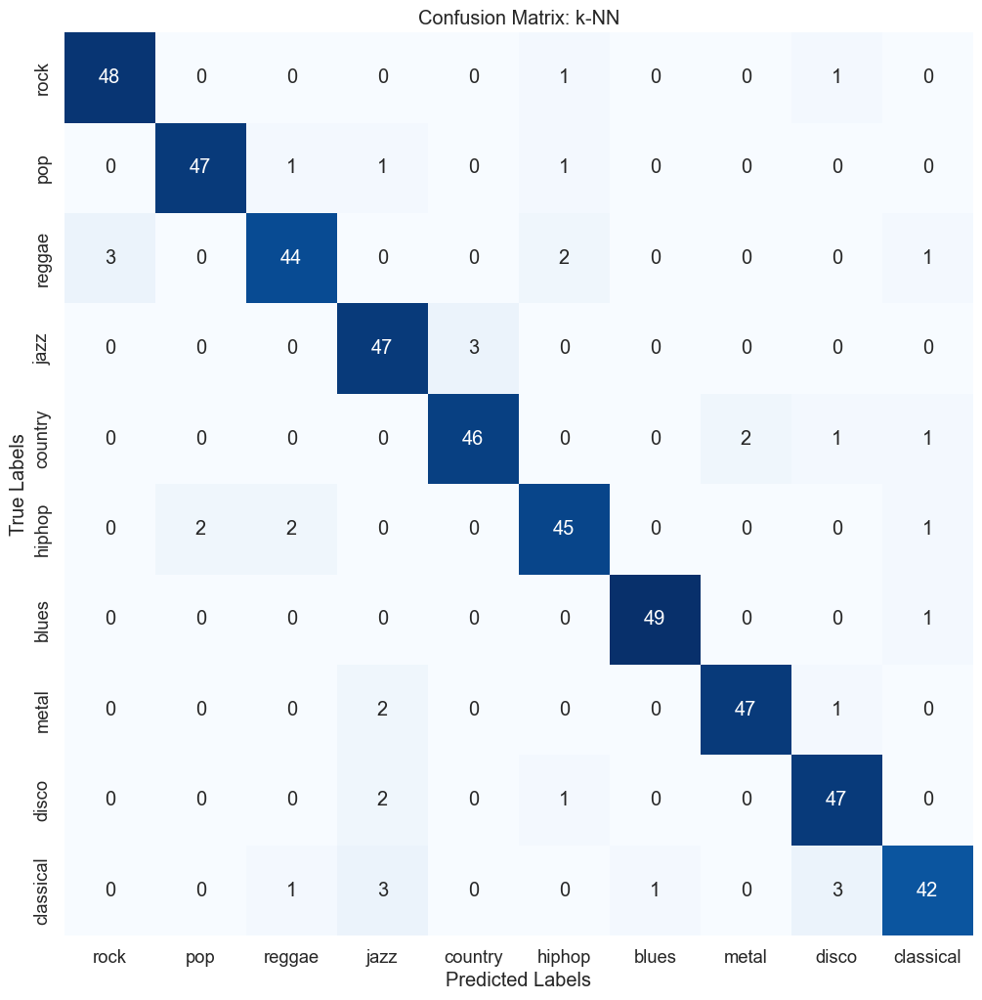

In [148]:
### model training
# instantiate the model
clf = KNeighborsClassifier(algorithm = 'auto', 
                           n_neighbors = 5,
                           p = 1,
                           weights = 'distance'
                           )

# Train the classifier on the training data
clf.fit(xTrainScaled, yTrain)
        
### model prediction and evaluation
# Make predictions on the test data
yPred = clf.predict(xTestScaled)

report = classification_report(yTest, yPred, target_names=all_genre_labels)
print(f'k-NN:{nl}{report}')

# Confusion Matrix
cm = confusion_matrix(yTest,yPred)

plt.figure(figsize=(12, 12))
sns.set(font_scale=1.2)  # Adjust font size for better readability

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=all_genre_labels,
            yticklabels=all_genre_labels)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix: k-NN')
plt.show()